# Summary

The purpose of the following is to identify the most suitable classifier(s) to predict whether the underwriting gain will be negative.<br><br>The classification is first imputed into the data, and the baseline accuracy is established. The predictors (features) are defined and the target columns are extracted. The data is then split into its train/test sets.<br><br>
The following classification models are then evaluated. In order to reduce execution runtime, all the hyperparameter tuning (via grid search) was carried out on Google Colab:
- Logistic Regression
- Decision Tree
- Random Forest
- Extra Trees
- Ada Boost
- Gradient Boosting
- K Nearest Neighbors
- Support Vector Machine   

# Import Packages

In [1]:
import pandas as pd
import seaborn as sns
sns.set(style='darkgrid')
import matplotlib.pyplot as plt
import math
import numpy as np
%matplotlib inline
%config IPCompleter.greedy=True

data_filepath = '../data/df_model_trimmed.csv'
df = pd.read_csv(data_filepath)

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, confusion_matrix, f1_score, classification_report
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, AdaBoostClassifier, GradientBoostingClassifier
import itertools
from collections import Counter
pd.options.display.max_columns = 999

In [2]:
df.head(2)

,year,company,auwgr,lkpp,hlr_lag1,hlr_lag2,hlr_lag3,hlr_lag4,hlr_lag5,mer,der,oer,prem_write_net_lag1,claim_set_net_lag1,exp_management_lag1,exp_comm_incur_net_lag1,exp_other_lag1,prem_liab_diff_lag1,claim_liab_diff_lag1,uw_gain_lag1,class_bonds,class_cnstr_engr,class_cpr,class_fire,class_health,class_mac,class_mahl,class_motor,class_others,class_pa,class_prof_indm,class_pub_lia,class_wic
0,2005,c166,3.293426,-4.904586,-2.184456,-2.256870,-2.410616,-2.700963,-2.822769,-0.294293,0.409648,-0.008518,49042.846154,-9272.769231,-13745.692308,19133.615385,-397.846154,7674.153846,11598.0,64032.307692,1,0,0,0,0,0,0,0,0,0,0,0,0
1,2007,c166,1.613955,1.239021,-4.777154,-3.032476,-2.410616,-2.700963,-2.822769,-0.323252,0.623761,-0.012615,35042.000000,-64709.000000,-10788.000000,20817.000000,-421.000000,15476.000000,20951.0,16368.000000,1,0,0,0,0,0,0,0,0,0,0,0,0


In [3]:
df.shape

(4347, 33)

# Prepare Features and Target

## Impute Classification
We want to predict when the overall underwriting gain (UWG) for an insurer is going to be negative so that the insurer can review its underwriting approach in general. Where possible, we also want to predict which specific classes of insurance (e.g. motor, fire, work injury, cargo etc) will yield negative UWG.<br><br>
Therefore, it would be apt to classify as follows:
- **Positive** classification (**'1'**) ---> **Negative UWG (uw_gain < 0)** (We want to predict this)
- **Negative** Classification (**'0'**) ---> **Positive UWG (uw_gain >= 0)**

Note that while the above definition may be counter-intuitive, it is appropriate for the data science problem on hand.

In [4]:
df['classification'] = [1 if i<0 else 0 for i in df['auwgr']]

In [5]:
print(df[(df['auwgr']<0) & (df['classification']==1)].count().values[0])
print(df[(df['auwgr']>=0) & (df['classification']==0)].count().values[0])

1388
2959


## Define Features

In [6]:
print(df.shape)
features = [col for col in 
            df._get_numeric_data().columns if (col != 'auwgr') and (col != 'year') and (col != 'classification')]
print(features)

(4347, 34)
['lkpp', 'hlr_lag1', 'hlr_lag2', 'hlr_lag3', 'hlr_lag4', 'hlr_lag5', 'mer', 'der', 'oer', 'prem_write_net_lag1', 'claim_set_net_lag1', 'exp_management_lag1', 'exp_comm_incur_net_lag1', 'exp_other_lag1', 'prem_liab_diff_lag1', 'claim_liab_diff_lag1', 'uw_gain_lag1', 'class_bonds', 'class_cnstr_engr', 'class_cpr', 'class_fire', 'class_health', 'class_mac', 'class_mahl', 'class_motor', 'class_others', 'class_pa', 'class_prof_indm', 'class_pub_lia', 'class_wic']


**NOTE:**<br>
In a previous iteration of feature engineering, the 13 classes of insurance ('class_* ') were dropped. However, this did not appear to have any effect on the accuracy/scores of the models belows. Therefore, we have decided to leave them in for now.

In [7]:
X = df[features]
y = df['classification']
print(X.shape)
print(y.shape)

(4347, 30)
(4347,)


# Baseline Accuracy

In [8]:
df['classification'].value_counts(normalize=True).sort_index()

0    0.680699
1    0.319301
Name: classification, dtype: float64

**Baseline Accuracy is** $0.68$

# Preparation

## Train/Test Split Data

In [9]:
# split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=42)
print(X_train.shape,X_test.shape)
print(y_train.shape,y_test.shape)

(3260, 30) (1087, 30)
(3260,) (1087,)


## Define Functions and Variables

In [10]:
# Variables (and their assignments) to be used in the following functions. 
thresholds = np.linspace(0, 1, 200)
labels_list = ['Positive UWG (0)','Negative UWG (1)']
y_label = 'Frequency'
x_label = 'Predicted Probability of Negative UWG (1)'

In [11]:
def plot_distr_of_outcomes(pred_proba_list, true_values, 
                                  class_labels, plot_title, ylabel, xlabel, v_line_ht=200, fig_size=(10,6)):
    
    pred_df = pd.DataFrame({'true_values': true_values,'pred_probs':pred_proba_list})
    
    plt.figure(figsize = fig_size)
    plt.hist(pred_df[pred_df['true_values'] == 0]['pred_probs'],bins=25,color='b',alpha = 0.6, label=class_labels[0])
    plt.hist(pred_df[pred_df['true_values'] == 1]['pred_probs'],bins=25,color='orange',alpha = 0.6, label=class_labels[1])
    plt.title(plot_title, fontsize=14)
    plt.ylabel(ylabel, fontsize=12)
    plt.xlabel(xlabel, fontsize=12)
    plt.legend(fontsize=12)
    plt.vlines(x=0.5,ymin = 0,ymax = v_line_ht,color='darkgreen',linestyle = '--')
    plt.show()
    return None

In [12]:
# Define function to calculate sensitivity. (True positive rate.)
def TPR(df, true_col, pred_prob_col, threshold):
    true_positive = df[(df[true_col] == 1) & (df[pred_prob_col] >= threshold)].shape[0]
    false_negative = df[(df[true_col] == 1) & (df[pred_prob_col] < threshold)].shape[0]
    return true_positive / (true_positive + false_negative)
    
# Define function to calculate 1 - specificity. (False positive rate.)
def FPR(df, true_col, pred_prob_col, threshold):
    true_negative = df[(df[true_col] == 0) & (df[pred_prob_col] <= threshold)].shape[0]
    false_positive = df[(df[true_col] == 0) & (df[pred_prob_col] > threshold)].shape[0]
    return 1 - (true_negative / (true_negative + false_positive))

# plot_title='Extra Trees Classifier: ROC Curve with AUC'
def plot_roc(pred_proba_list, true_values, plot_title='ROC Curve with AUC', fig_size=(10,6)):

    pred_df = pd.DataFrame({'true_values': true_values,'pred_probs':pred_proba_list})
    
    # Calculate sensitivity & 1-specificity for each threshold between 0 and 1.
    tpr_values = [TPR(pred_df, 'true_values', 'pred_probs', prob) for prob in thresholds]
    fpr_values = [FPR(pred_df, 'true_values', 'pred_probs', prob) for prob in thresholds]

    plt.figure(figsize = fig_size)
    # Plot ROC curve.
    plt.plot(fpr_values, # False Positive Rate on X-axis
             tpr_values, # True Positive Rate on Y-axis
             label='ROC Curve')
    
    # Plot baseline. (Perfect overlap between the two populations.)
    plt.plot(np.linspace(0, 1, 200), np.linspace(0, 1, 200), label='baseline', linestyle='--')
    plt.title(f'{plot_title} = {round(roc_auc_score(pred_df["true_values"],pred_df["pred_probs"]),3)}',fontsize=14)
    plt.ylabel('Sensitivity', fontsize=12)
    plt.xlabel('1 - Specificity', fontsize=12)
    plt.legend(fontsize=12);
    return None

# Models

## Logistic Regression Classifier

In [13]:
# lr = LogisticRegression(fit_intercept=False,C=1.0,tol=0.0001,penalty='l2')
lr = LogisticRegression(solver='lbfgs')
lr.fit(X_train,y_train)
print('Score(train/test):',lr.score(X_train, y_train),',',lr.score(X_test, y_test))
# print('Score (test):\t',lr.score(X_test, y_test))
print('\n=== Classification Report  ================================')
# predict & evaluate
predictions = lr.predict(X_test)
print(classification_report(y_test,predictions,target_names=['Positive UWG (0)','Negative UWG (1)']))

Score(train/test): 0.7239263803680982 , 0.7230910763569457

=== Classification Report  ================================
                  precision    recall  f1-score   support

Positive UWG (0)       0.76      0.86      0.81       740
Negative UWG (1)       0.59      0.44      0.50       347

        accuracy                           0.72      1087
       macro avg       0.68      0.65      0.65      1087
    weighted avg       0.71      0.72      0.71      1087



### GridSearchCV

The following Grid Searches were carried out on Google Colab.

In [ ]:
# params = [{'fit_intercept': [True, False],
#            'C': [0.5,0.6,0.7,0.8,0.9,1.0,1.1,1.2,1.3,1.4],
#            'tol': [0.00001,0.0001,0.001,0.01,0.1],
#            'penalty': ['l2'],
#           #  'penalty': ['l1','l2'],
#            'max_iter': [5000],
#           #  'solver': ['newton-cg','lbfgs','liblinear','sag','saga'] no go
#            'solver': ['lbfgs','liblinear','sag','saga']
#            }]

# gs = GridSearchCV(LogisticRegression(), param_grid=params, cv=5)
# gs.fit(X_train, y_train)
# gs.best_params_

The Grid Search returned the following best_params_:<br><br>
*{'C': 1.0,
 'fit_intercept': True,
 'max_iter': 5000,
 'penalty': 'l2',
 'solver': 'sag',
 'tol': 0.1}*
 <br><br>

In [56]:
lr = LogisticRegression(C=1.0,fit_intercept=True,max_iter=5000,penalty='l2',solver='sag',tol=0.1)
lr.fit(X_train,y_train)
print('Score(train/test):',lr.score(X_train, y_train),',',lr.score(X_test, y_test))
# print('Score (test):\t',lr.score(X_test, y_test))
print('\n=== Classification Report  ================================')
# predict & evaluate
predictions = lr.predict(X_test)
print(classification_report(y_test,predictions,target_names=['Positive UWG (0)','Negative UWG (1)']))

Score(train/test): 0.7220858895705522 , 0.7230910763569457

=== Classification Report  ================================
                  precision    recall  f1-score   support

Positive UWG (0)       0.77      0.84      0.81       740
Negative UWG (1)       0.58      0.46      0.52       347

        accuracy                           0.72      1087
       macro avg       0.68      0.65      0.66      1087
    weighted avg       0.71      0.72      0.71      1087



### Plot Distribution of Outcomes

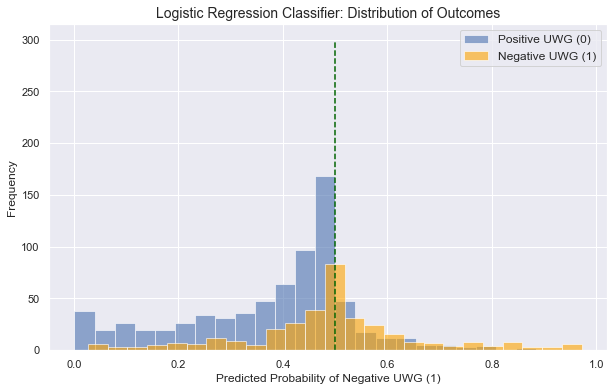

In [57]:
v_line_max = 300
plot_title = 'Logistic Regression Classifier: Distribution of Outcomes'
prediction_probabilities = [i[1] for i in lr.predict_proba(X_test)]
plot_distr_of_outcomes(prediction_probabilities, y_test, labels_list, plot_title, y_label, x_label, v_line_max)

### Plot Receiver Operator Curve (ROC)

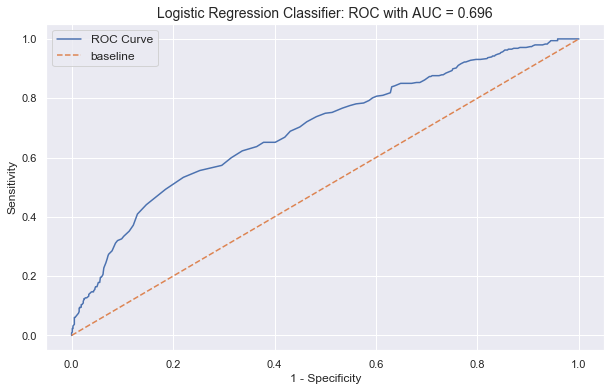

In [58]:
plot_title = 'Logistic Regression Classifier: ROC with AUC'
plot_roc(prediction_probabilities, y_test, plot_title)

### Segregate by Insurance Class (Type)

Baseline accuracy for "class_bonds": 0.7591836734693878
Shape (train/test): (183, 30) (62, 30)
Test Score (min/max): 0.7258064516129032  ,  0.7419354838709677

=== Confusion Matrix  =====================================
TP: 4 	TN: 42
FP: 5 	FN: 11
RECALL: 0.26666666666666666


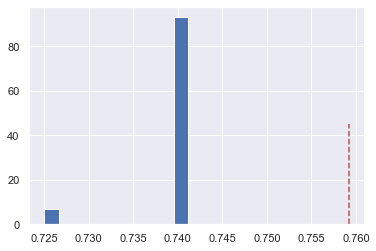

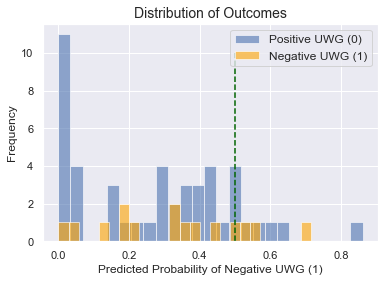

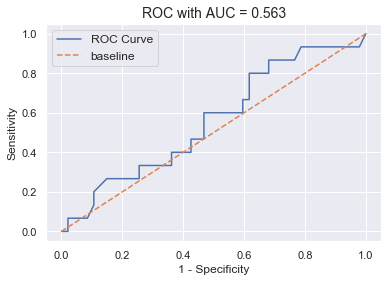

Baseline accuracy for "class_cnstr_engr": 0.7380952380952381
Shape (train/test): (220, 30) (74, 30)
Test Score (min/max): 0.7297297297297297  ,  0.7837837837837838

=== Confusion Matrix  =====================================
TP: 3 	TN: 52
FP: 3 	FN: 16
RECALL: 0.15789473684210525


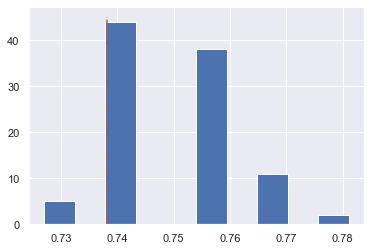

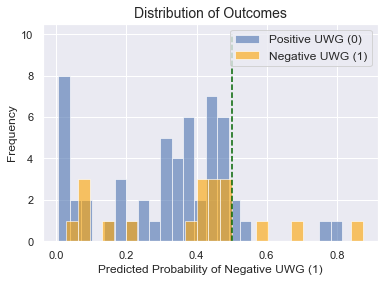

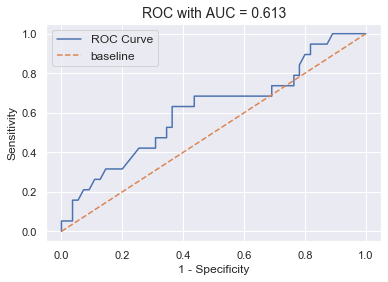

Baseline accuracy for "class_cpr": 0.5176470588235295
Shape (train/test): (63, 30) (22, 30)
Test Score (min/max): 0.5454545454545454  ,  0.7272727272727273

=== Confusion Matrix  =====================================
TP: 6 	TN: 8
FP: 3 	FN: 5
RECALL: 0.5454545454545454


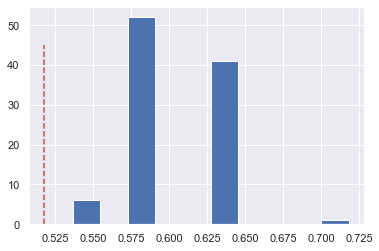

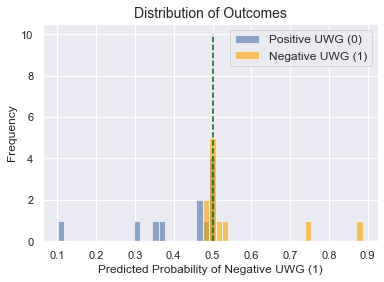

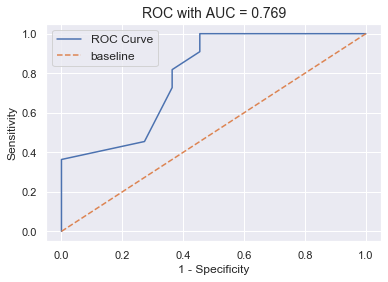

Baseline accuracy for "class_fire": 0.7475915221579962
Shape (train/test): (389, 30) (130, 30)
Test Score (min/max): 0.7384615384615385  ,  0.7615384615384615

=== Confusion Matrix  =====================================
TP: 2 	TN: 96
FP: 1 	FN: 31
RECALL: 0.06060606060606061


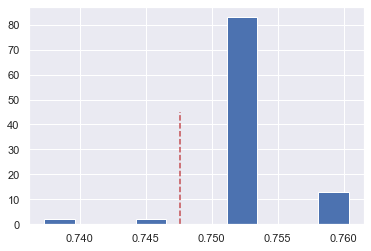

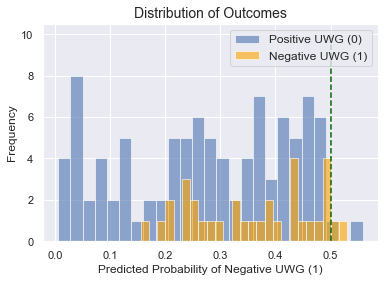

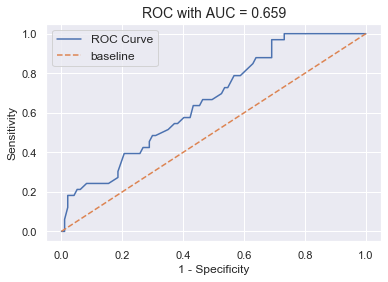

Baseline accuracy for "class_health": 0.6423357664233577
Shape (train/test): (205, 30) (69, 30)
Test Score (min/max): 0.6376811594202898  ,  0.7391304347826086

=== Confusion Matrix  =====================================
TP: 13 	TN: 37
FP: 7 	FN: 12
RECALL: 0.52


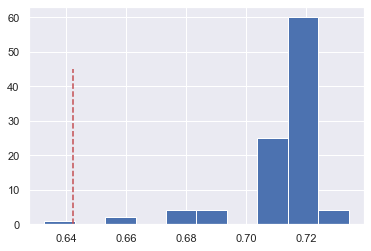

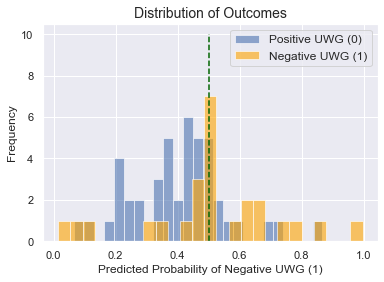

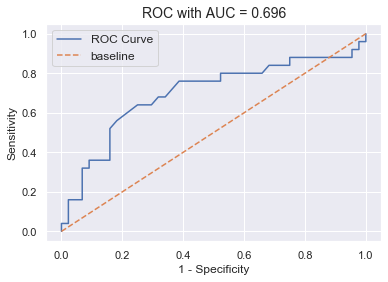

Baseline accuracy for "class_mac": 0.7645739910313901
Shape (train/test): (334, 30) (112, 30)
Test Score (min/max): 0.7589285714285714  ,  0.8035714285714286

=== Confusion Matrix  =====================================
TP: 6 	TN: 81
FP: 5 	FN: 20
RECALL: 0.23076923076923078


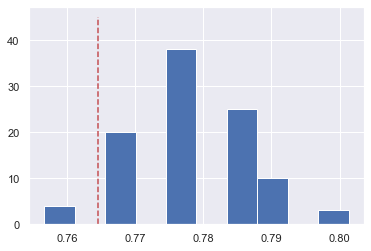

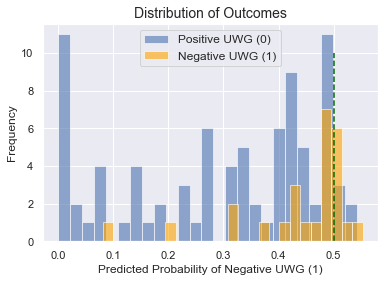

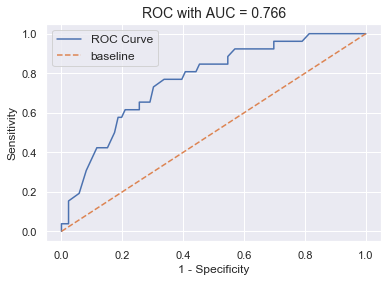

Baseline accuracy for "class_mahl": 0.5260416666666666
Shape (train/test): (288, 30) (96, 30)
Test Score (min/max): 0.5520833333333334  ,  0.625

=== Confusion Matrix  =====================================
TP: 25 	TN: 32
FP: 19 	FN: 20
RECALL: 0.5555555555555556


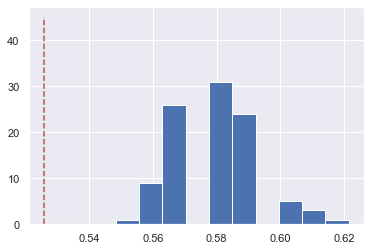

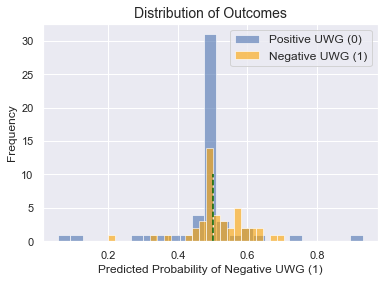

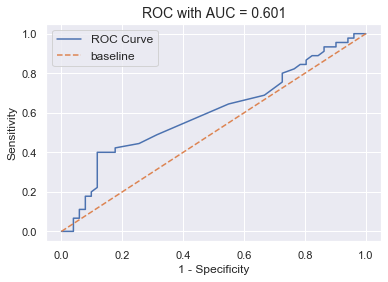

Baseline accuracy for "class_motor": 0.5229007633587787
Shape (train/test): (196, 30) (66, 30)
Test Score (min/max): 0.5909090909090909  ,  0.6818181818181818

=== Confusion Matrix  =====================================
TP: 25 	TN: 16
FP: 15 	FN: 10
RECALL: 0.7142857142857143


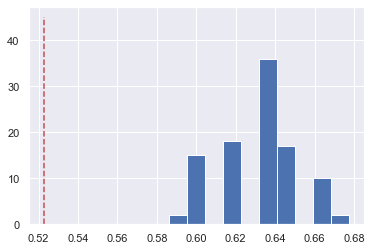

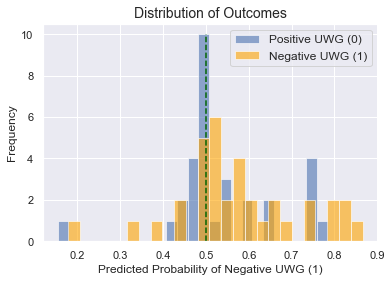

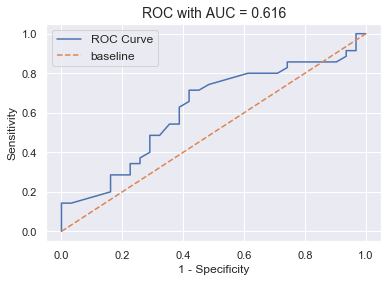

Baseline accuracy for "class_others": 0.7834821428571429
Shape (train/test): (336, 30) (112, 30)
Test Score (min/max): 0.7857142857142857  ,  0.8035714285714286

=== Confusion Matrix  =====================================
TP: 4 	TN: 86
FP: 2 	FN: 20
RECALL: 0.16666666666666666


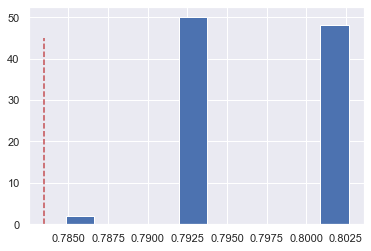

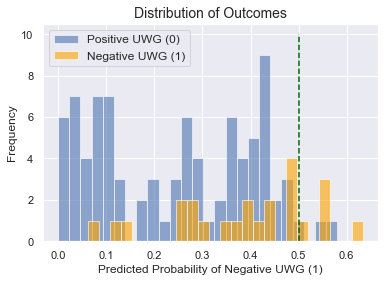

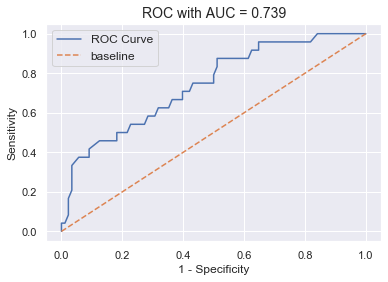

Baseline accuracy for "class_pa": 0.7356948228882834
Shape (train/test): (275, 30) (92, 30)
Test Score (min/max): 0.6739130434782609  ,  0.717391304347826

=== Confusion Matrix  =====================================
TP: 7 	TN: 58
FP: 10 	FN: 17
RECALL: 0.2916666666666667


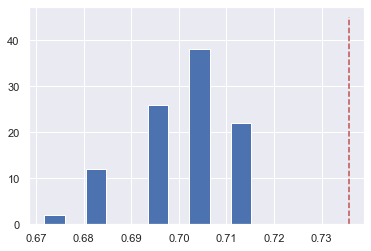

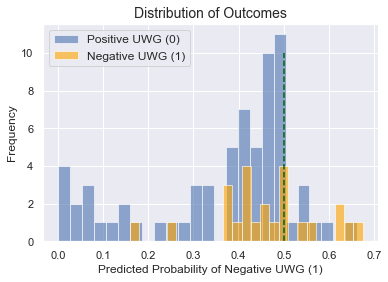

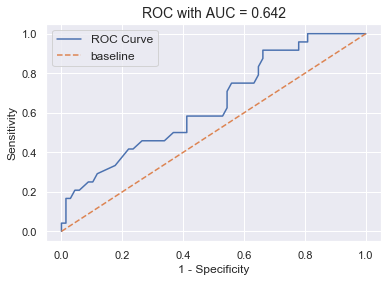

Baseline accuracy for "class_prof_indm": 0.6886446886446886
Shape (train/test): (204, 30) (69, 30)
Test Score (min/max): 0.6956521739130435  ,  0.7681159420289855

=== Confusion Matrix  =====================================
TP: 0 	TN: 48
FP: 0 	FN: 21
RECALL: 0.0


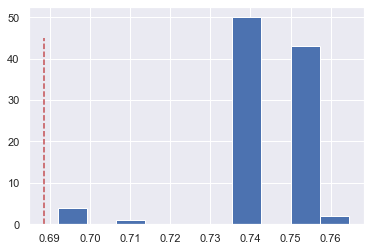

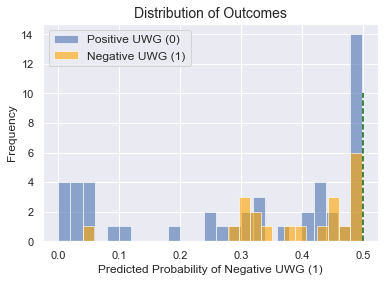

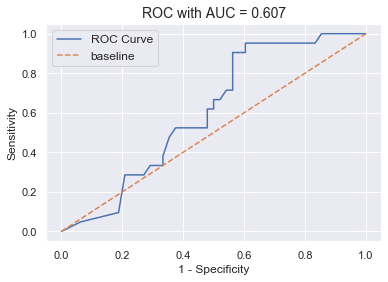

Baseline accuracy for "class_pub_lia": 0.7443181818181818
Shape (train/test): (264, 30) (88, 30)
Test Score (min/max): 0.7272727272727273  ,  0.7272727272727273

=== Confusion Matrix  =====================================
TP: 0 	TN: 64
FP: 2 	FN: 22
RECALL: 0.0


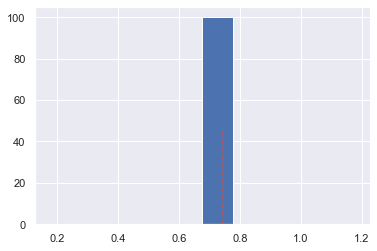

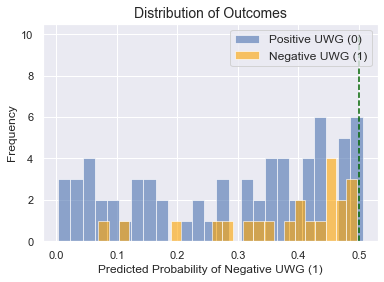

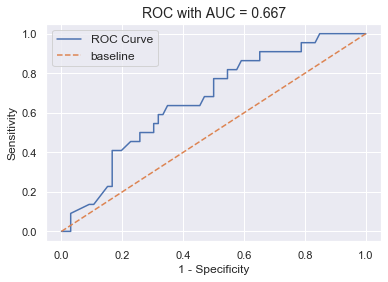

Baseline accuracy for "class_wic": 0.5251256281407035
Shape (train/test): (298, 30) (100, 30)
Test Score (min/max): 0.54  ,  0.64

=== Confusion Matrix  =====================================
TP: 30 	TN: 30
FP: 23 	FN: 17
RECALL: 0.6382978723404256


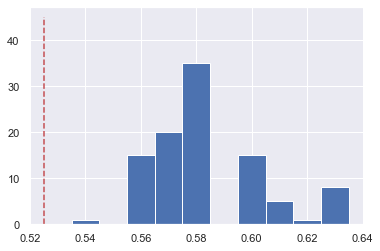

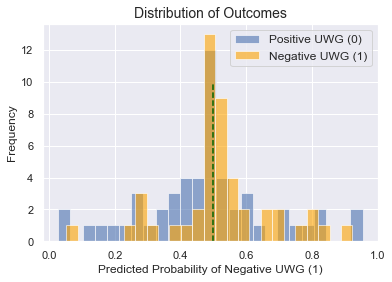

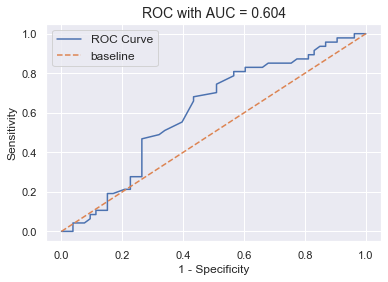

In [59]:
ins_classes = ['class_bonds','class_cnstr_engr','class_cpr','class_fire','class_health',
               'class_mac','class_mahl','class_motor','class_others','class_pa',
               'class_prof_indm','class_pub_lia','class_wic']

df_full = pd.read_csv(data_filepath)
df_full['classification'] = [1 if i<0 else 0 for i in df_full['auwgr']]

for ins_class_item in ins_classes:
    
    df = df_full[df_full[ins_class_item]==1].copy()
    
    baseline = max(df['classification'].value_counts(normalize=True).sort_values())
    print('Baseline accuracy for "'+ins_class_item+'":',baseline)
    
    features = [col for col in 
            df._get_numeric_data().columns if (col != 'auwgr') and (col != 'year') and (col != 'classification')]
    X = df[features]
    y = df['classification']
    X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y)
    print('Shape (train/test):',X_train.shape,X_test.shape)

    score_list=[]
    for i in np.arange(0,100,1):        
        lr = LogisticRegression(C=1.0,fit_intercept=True,max_iter=5000,penalty='l2',solver='sag',tol=0.1)
        lr.fit(X_train,y_train)
        score_list.append(lr.score(X_test, y_test))

    print('Test Score (min/max):',min(score_list),' , ',max(score_list))
    
    predictions = lr.predict(X_test)
    print('\n=== Confusion Matrix  =====================================')
    tn, fp, fn, tp = confusion_matrix(y_test, predictions).ravel()
    print('TP:',tp,'\tTN:',tn)
    print('FP:',fp,'\tFN:',fn)
    print('RECALL:',tp/(tp+fn))
    
    plt.hist(score_list,bins=10,align='left')
    plt.vlines(x=baseline,ymin=0,ymax=45,colors='r',linestyles='dashed')
    
    v_line_max = 10
    plot_title = 'Distribution of Outcomes'
    prediction_probabilities = [i[1] for i in lr.predict_proba(X_test)]
    plot_distr_of_outcomes(prediction_probabilities, y_test, labels_list, plot_title, y_label, x_label, v_line_max, (6,4))
    
    plot_title = 'ROC with AUC'
    plot_roc(prediction_probabilities, y_test, plot_title, (6,4))
  
    plt.show()

### Comments (Best Recall)
Whilst the Logistic Regression Classifier does not yield the best accuracy score (Extra Trees Classifier fares better in accuracy), it has the highest overall RECALL score of the classification models tested with the dataset.<br>

- RECALL for the aggregate dataset = 0.44<br>

- RECALL for the individual insurance classes as follows:
        - class_bonds: 0.26
        - class_cnstr_engr: 0.16
        - class_cpr: 0.55
        - class_fire: 0.06
        - class_health: 0.52
        - class_mac: 0.23
        - class_mahl: 0.56
        - class_motor: 0.71
        - class_others: 0.17
        - class_pa: 0.29
        - class_prof_indm: 0.0
        - class_pub_lia: 0.0
        - class_wic: 0.64

## Decision Tree Classifier

In [44]:
df = pd.read_csv(data_filepath)
df['classification'] = [1 if i<0 else 0 for i in df['auwgr']]
features = [col for col in 
            df._get_numeric_data().columns if (col != 'auwgr') and (col != 'year') and (col != 'classification')]
X = df[features]
y = df['classification']
# split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=42)
print(X_train.shape,X_test.shape)
print(y_train.shape,y_test.shape)

(3260, 30) (1087, 30)
(3260,) (1087,)


In [16]:
# use default parameters
dtcf = DecisionTreeClassifier()
dtcf.fit(X_train,y_train)
# Evaluate model.
print('Score(train/test):',lr.score(X_train, y_train),',',lr.score(X_test, y_test))
# predict & evaluate
predictions = dtcf.predict(X_test)
print('\n=== Classification Report  ================================')
print(classification_report(y_test,predictions,target_names=['Positive UWG (0)','Negative UWG (1)']))

Score(train/test): 0.7239263803680982 , 0.7230910763569457

=== Classification Report  ================================
                  precision    recall  f1-score   support

Positive UWG (0)       0.74      0.75      0.75       740
Negative UWG (1)       0.46      0.45      0.45       347

        accuracy                           0.65      1087
       macro avg       0.60      0.60      0.60      1087
    weighted avg       0.65      0.65      0.65      1087



### Plot Decision Tree Graph

In [17]:
#pip install pydotplus

In [18]:
# brew install graphviz
# Use graphviz to make a chart of the regression tree decision points:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

C:\Users\XXX\Anaconda3\lib\site-packages\sklearn\externals\six.py:31: DeprecationWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", DeprecationWarning)


In [19]:
dot_data = StringIO()  

export_graphviz(dtcf, out_file=dot_data,  
                filled=True, rotate=True, rounded=True,
                special_characters=True)  

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())  

From the above graph, we note that the root node is variable "X16" which corresponds to column "uw_gain_lag1". This is the underwriting gain/loss for the previous year.
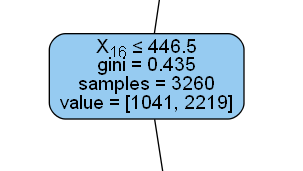

## Random Forest Classifier

In [44]:
df = pd.read_csv(data_filepath)
df['classification'] = [1 if i<0 else 0 for i in df['auwgr']]
features = [col for col in 
            df._get_numeric_data().columns if (col != 'auwgr') and (col != 'year') and (col != 'classification')]
X = df[features]
y = df['classification']
# split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=42)
print(X_train.shape,X_test.shape)
print(y_train.shape,y_test.shape)

(3260, 30) (1087, 30)
(3260,) (1087,)


In [20]:
# use default parameters
rfcf = RandomForestClassifier(n_estimators=10)
rfcf.fit(X_train,y_train)
# Evaluate model.
print('Score(train/test):',rfcf.score(X_train, y_train),',',rfcf.score(X_test, y_test))
# predict & evaluate
predictions = rfcf.predict(X_test)
print('\n=== Classification Report  ================================')
print(classification_report(y_test,predictions,target_names=['Positive UWG (0)','Negative UWG (1)']))

Score(train/test): 0.9822085889570552 , 0.703771849126035

=== Classification Report  ================================
                  precision    recall  f1-score   support

Positive UWG (0)       0.73      0.89      0.80       740
Negative UWG (1)       0.57      0.31      0.40       347

        accuracy                           0.70      1087
       macro avg       0.65      0.60      0.60      1087
    weighted avg       0.68      0.70      0.67      1087



### Plot Distribution of Outcomes

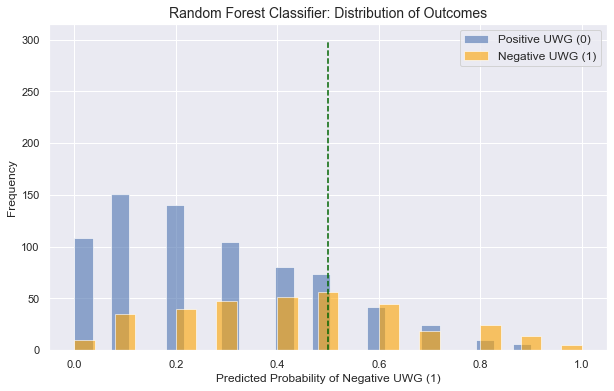

In [21]:
v_line_max = 300
plot_title = 'Random Forest Classifier: Distribution of Outcomes'
prediction_probabilities = [i[1] for i in rfcf.predict_proba(X_test)]
plot_distr_of_outcomes(prediction_probabilities, y_test, labels_list, plot_title, y_label, x_label, v_line_max)

### Plot Receiver Operator Curve (ROC)

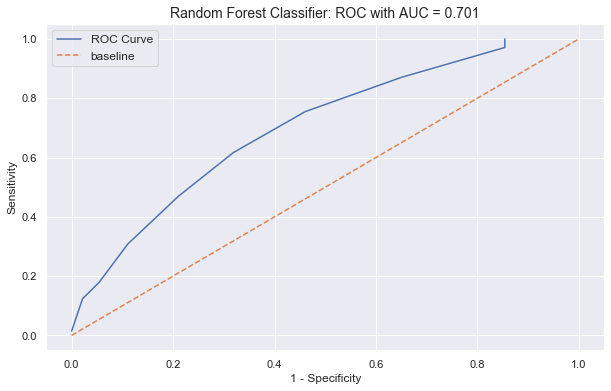

In [22]:
plot_title = 'Random Forest Classifier: ROC with AUC'
plot_roc(prediction_probabilities, y_test, plot_title)

## Extra Trees Classifier

In [23]:
etcf = ExtraTreesClassifier(bootstrap=True,oob_score=True,warm_start=False,n_estimators=100)
etcf.fit(X_train,y_train)
# Evaluate model.
print('Score(train/test):',etcf.score(X_train, y_train),',',etcf.score(X_test, y_test))
# predict & evaluate
predictions = etcf.predict(X_test)
print('\n=== Classification Report  ================================')
print(classification_report(y_test,predictions,target_names=['Positive UWG (0)','Negative UWG (1)']))

Score(train/test): 1.0 , 0.7332106715731371

=== Classification Report  ================================
                  precision    recall  f1-score   support

Positive UWG (0)       0.75      0.91      0.82       740
Negative UWG (1)       0.64      0.37      0.47       347

        accuracy                           0.73      1087
       macro avg       0.70      0.64      0.64      1087
    weighted avg       0.72      0.73      0.71      1087



### GridSearchCV

The following Grid Searches were carried out on Google Colab.

In [24]:
# # Search No.1
# params = [{'n_estimators':[100,200,300],
#                'max_depth':range(2,10),
#                'min_samples_split':range(2,20),
#                'oob_score':[True],
#                'bootstrap':[True]
#               }]

# # Search No.2
# params = [{'n_estimators':[50,100,150],
#                'max_depth':range(9,14),
#                'min_samples_split':range(5,15),
#                'oob_score':[True],
#                'bootstrap':[True]
#               }]

# # Search No.3
# params = [{'n_estimators':[100,150,200],
#                'max_depth':range(12,30),
#                'min_samples_split':range(5,30),
#                'oob_score':[True],
#                'bootstrap':[True]
#               }]

# Search No.4
# params = [{'n_estimators':[120,150],
#                'max_depth':range(24,35),
#                'min_samples_split':range(15,30),
#                'oob_score':[True],
#                'bootstrap':[True]
#               }]

# gs = GridSearchCV(ExtraTreesClassifier(), param_grid=params, cv=5)
# gs.fit(X_train, y_train)
# gs.best_params_

The Grid Search returned the following best_params_:<br><br>
*{'bootstrap': True,
 'max_depth': 31,
 'min_samples_split': 27,
 'n_estimators': 150,
 'oob_score': True}*
 <br><br>

In [25]:
# use the best_params_ given by the Grid Search above - 
etcf = ExtraTreesClassifier(bootstrap=True,max_depth=31,min_samples_split=27,n_estimators=150,oob_score=True)
etcf.fit(X_train,y_train)
# Evaluate model.
print('Score(train/test):',etcf.score(X_train, y_train),',',etcf.score(X_test, y_test))
# predict & evaluate
predictions = etcf.predict(X_test)
print('\n=== Classification Report  ================================')

print(classification_report(y_test,predictions,target_names=['Positive UWG (0)','Negative UWG (1)']))

print('\n=== Confusion Matrix  =====================================')
tn, fp, fn, tp = confusion_matrix(y_test, predictions).ravel()
print('TP:',tp,'\tTN:',tn)
print('FP:',fp,'\tFN:',fn)
print('RECALL:',tp/(tp+fn))

Score(train/test): 0.8076687116564417 , 0.7396504139834407

=== Classification Report  ================================
                  precision    recall  f1-score   support

Positive UWG (0)       0.75      0.93      0.83       740
Negative UWG (1)       0.70      0.33      0.45       347

        accuracy                           0.74      1087
       macro avg       0.72      0.63      0.64      1087
    weighted avg       0.73      0.74      0.71      1087


=== Confusion Matrix  =====================================
TP: 114 	TN: 690
FP: 50 	FN: 233
RECALL: 0.3285302593659942


### Plot Distribution of Outcomes

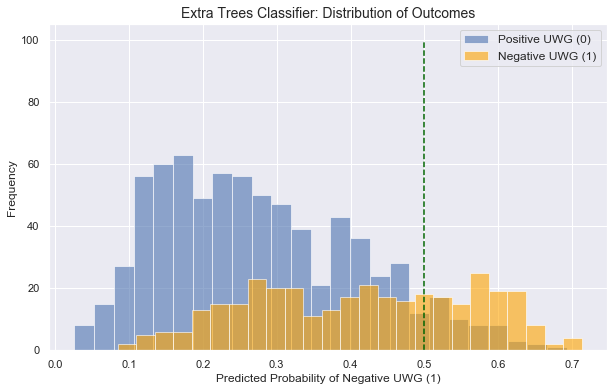

In [26]:
v_line_max = 100
plot_title = 'Extra Trees Classifier: Distribution of Outcomes'
prediction_probabilities = [i[1] for i in etcf.predict_proba(X_test)]
plot_distr_of_outcomes(prediction_probabilities, y_test, labels_list, plot_title, y_label, x_label, v_line_max)

### Plot Receiver Operator Curve (ROC)

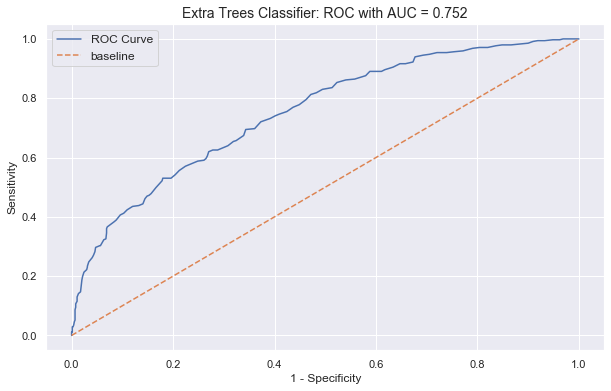

In [27]:
plot_title = 'Extra Trees Classifier: ROC with AUC'
plot_roc(prediction_probabilities, y_test, plot_title)

### Segregate by Insurance Class (Type)

Baseline accuracy for "class_bonds": 0.7591836734693878
Shape (train/test): (183, 30) (62, 30)
Test Score (min/max): 0.7580645161290323  ,  0.7580645161290323

=== Confusion Matrix  =====================================
TP: 0 	TN: 47
FP: 0 	FN: 15
RECALL: 0.0


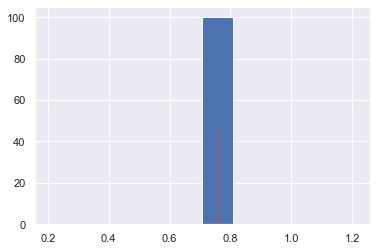

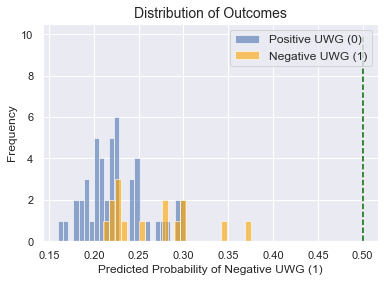

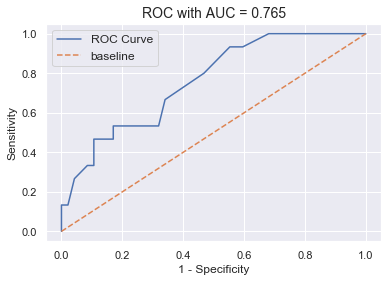

Baseline accuracy for "class_cnstr_engr": 0.7380952380952381
Shape (train/test): (220, 30) (74, 30)
Test Score (min/max): 0.7432432432432432  ,  0.7432432432432432

=== Confusion Matrix  =====================================
TP: 0 	TN: 55
FP: 0 	FN: 19
RECALL: 0.0


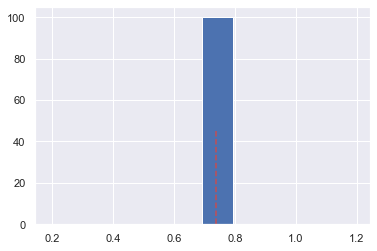

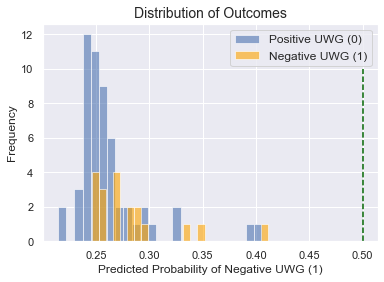

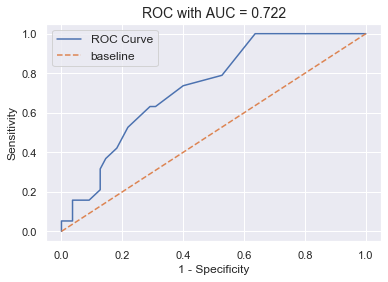

Baseline accuracy for "class_cpr": 0.5176470588235295
Shape (train/test): (63, 30) (22, 30)
Test Score (min/max): 0.5909090909090909  ,  0.7272727272727273

=== Confusion Matrix  =====================================
TP: 5 	TN: 10
FP: 1 	FN: 6
RECALL: 0.45454545454545453


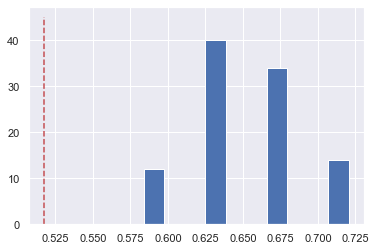

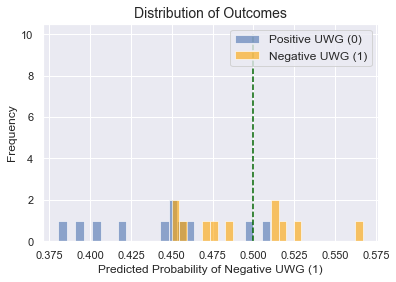

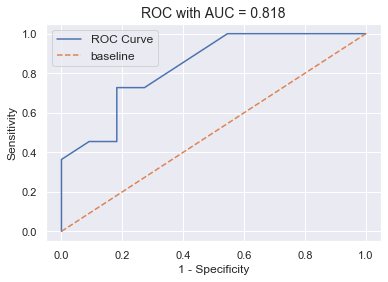

Baseline accuracy for "class_fire": 0.7475915221579962
Shape (train/test): (389, 30) (130, 30)
Test Score (min/max): 0.7461538461538462  ,  0.7461538461538462

=== Confusion Matrix  =====================================
TP: 0 	TN: 97
FP: 0 	FN: 33
RECALL: 0.0


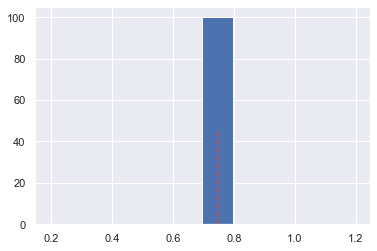

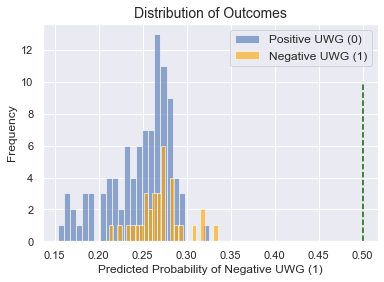

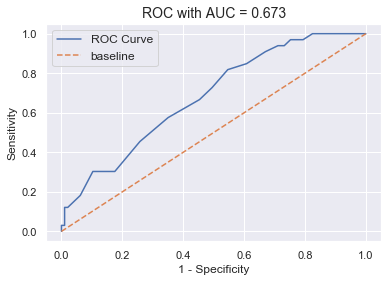

Baseline accuracy for "class_health": 0.6423357664233577
Shape (train/test): (205, 30) (69, 30)
Test Score (min/max): 0.6231884057971014  ,  0.6811594202898551

=== Confusion Matrix  =====================================
TP: 5 	TN: 41
FP: 3 	FN: 20
RECALL: 0.2


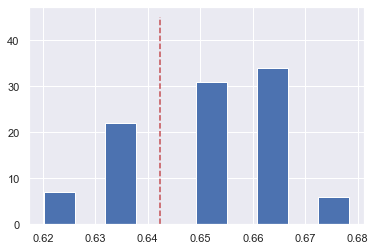

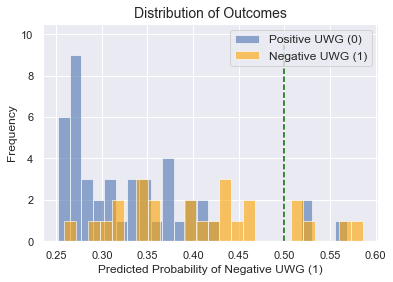

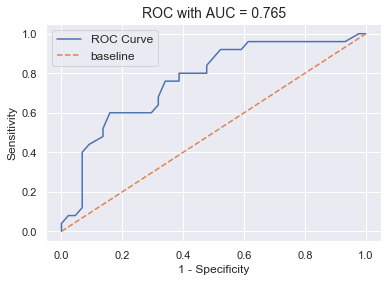

Baseline accuracy for "class_mac": 0.7645739910313901
Shape (train/test): (334, 30) (112, 30)
Test Score (min/max): 0.7678571428571429  ,  0.7678571428571429

=== Confusion Matrix  =====================================
TP: 0 	TN: 86
FP: 0 	FN: 26
RECALL: 0.0


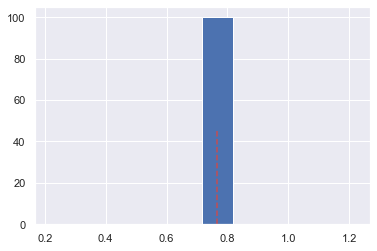

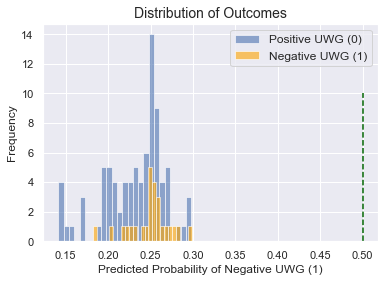

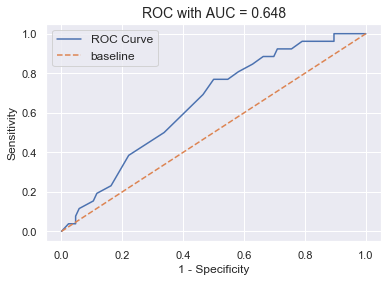

Baseline accuracy for "class_mahl": 0.5260416666666666
Shape (train/test): (288, 30) (96, 30)
Test Score (min/max): 0.4791666666666667  ,  0.5729166666666666

=== Confusion Matrix  =====================================
TP: 2 	TN: 48
FP: 3 	FN: 43
RECALL: 0.044444444444444446


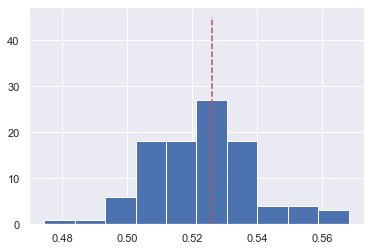

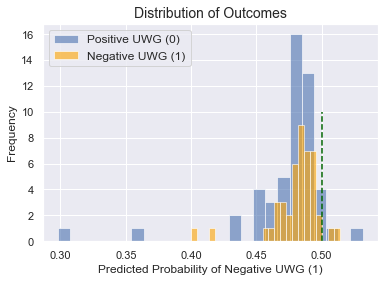

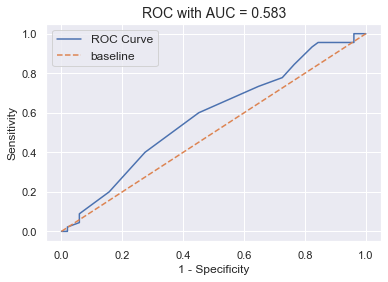

Baseline accuracy for "class_motor": 0.5229007633587787
Shape (train/test): (196, 30) (66, 30)
Test Score (min/max): 0.5909090909090909  ,  0.6666666666666666

=== Confusion Matrix  =====================================
TP: 27 	TN: 16
FP: 15 	FN: 8
RECALL: 0.7714285714285715


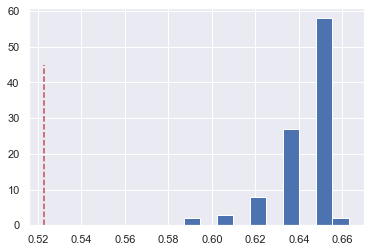

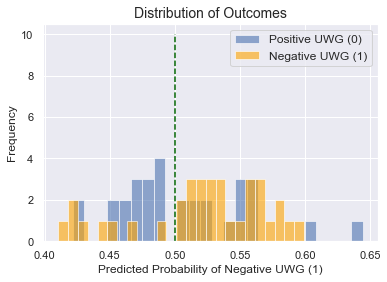

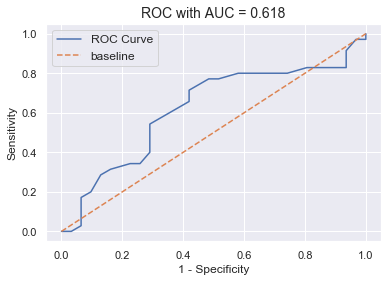

Baseline accuracy for "class_others": 0.7834821428571429
Shape (train/test): (336, 30) (112, 30)
Test Score (min/max): 0.7857142857142857  ,  0.7857142857142857

=== Confusion Matrix  =====================================
TP: 0 	TN: 88
FP: 0 	FN: 24
RECALL: 0.0


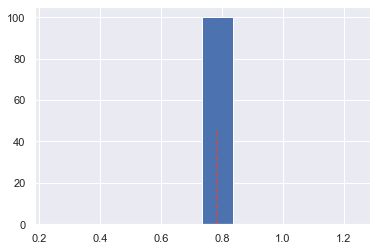

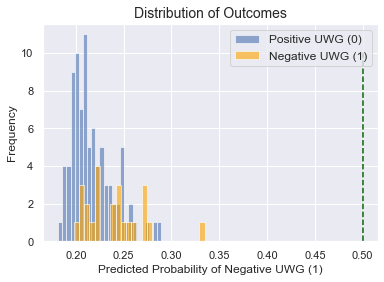

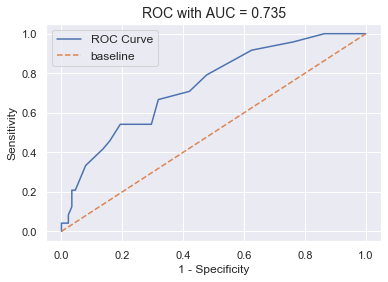

Baseline accuracy for "class_pa": 0.7356948228882834
Shape (train/test): (275, 30) (92, 30)
Test Score (min/max): 0.7391304347826086  ,  0.7391304347826086

=== Confusion Matrix  =====================================
TP: 0 	TN: 68
FP: 0 	FN: 24
RECALL: 0.0


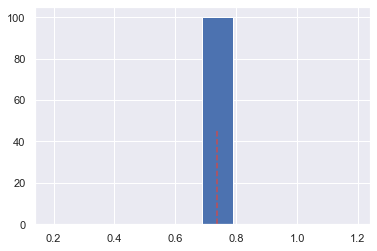

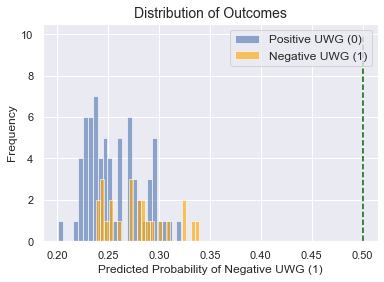

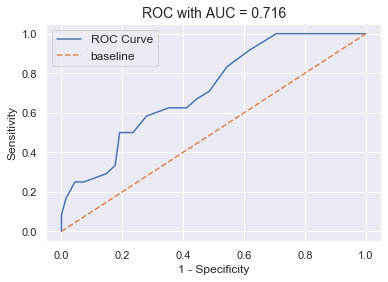

Baseline accuracy for "class_prof_indm": 0.6886446886446886
Shape (train/test): (204, 30) (69, 30)
Test Score (min/max): 0.6956521739130435  ,  0.6956521739130435

=== Confusion Matrix  =====================================
TP: 0 	TN: 48
FP: 0 	FN: 21
RECALL: 0.0


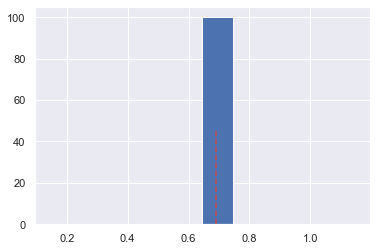

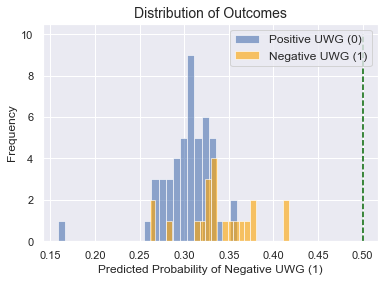

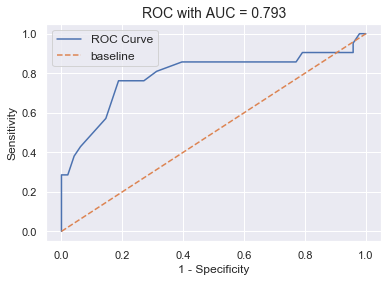

Baseline accuracy for "class_pub_lia": 0.7443181818181818
Shape (train/test): (264, 30) (88, 30)
Test Score (min/max): 0.75  ,  0.75

=== Confusion Matrix  =====================================
TP: 0 	TN: 66
FP: 0 	FN: 22
RECALL: 0.0


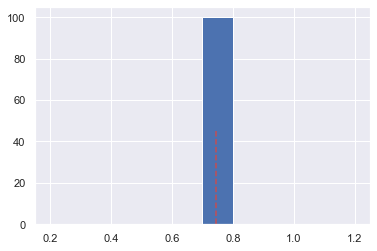

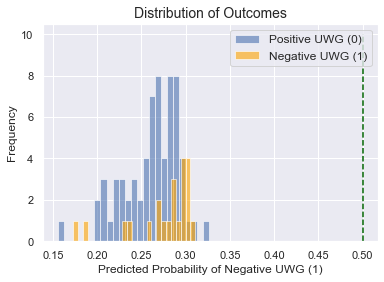

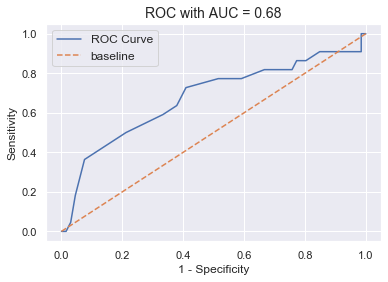

Baseline accuracy for "class_wic": 0.5251256281407035
Shape (train/test): (298, 30) (100, 30)
Test Score (min/max): 0.54  ,  0.62

=== Confusion Matrix  =====================================
TP: 12 	TN: 45
FP: 8 	FN: 35
RECALL: 0.2553191489361702


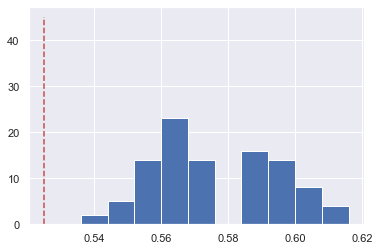

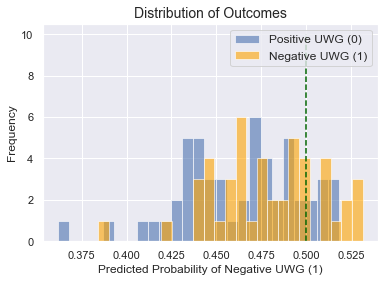

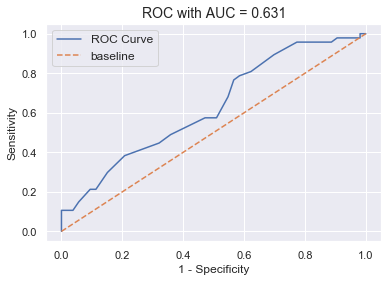

In [29]:
ins_classes = ['class_bonds','class_cnstr_engr','class_cpr','class_fire','class_health',
               'class_mac','class_mahl','class_motor','class_others','class_pa',
               'class_prof_indm','class_pub_lia','class_wic']

df_full = pd.read_csv(data_filepath)
df_full['classification'] = [1 if i<0 else 0 for i in df_full['auwgr']]

for ins_class_item in ins_classes:
    
    df = df_full[df_full[ins_class_item]==1].copy()
    
    baseline = max(df['classification'].value_counts(normalize=True).sort_values())
    print('Baseline accuracy for "'+ins_class_item+'":',baseline)
    
    features = [col for col in 
            df._get_numeric_data().columns if (col != 'auwgr') and (col != 'year') and (col != 'classification')]
    X = df[features]
    y = df['classification']
    X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y)
    print('Shape (train/test):',X_train.shape,X_test.shape)

    score_list=[]
    for i in np.arange(0,100,1):
        etcf = ExtraTreesClassifier(bootstrap=True,max_depth=2,min_samples_split=2,
                                    n_estimators=350,oob_score=True,random_state=i)
        etcf.fit(X_train,y_train)
        score_list.append(etcf.score(X_test, y_test))

    print('Test Score (min/max):',min(score_list),' , ',max(score_list))
    
    predictions = etcf.predict(X_test)
    print('\n=== Confusion Matrix  =====================================')
    tn, fp, fn, tp = confusion_matrix(y_test, predictions).ravel()
    print('TP:',tp,'\tTN:',tn)
    print('FP:',fp,'\tFN:',fn)
    print('RECALL:',tp/(tp+fn))
    
    plt.hist(score_list,bins=10,align='left')
    plt.vlines(x=baseline,ymin=0,ymax=45,colors='r',linestyles='dashed')
    
    v_line_max = 10
    plot_title = 'Distribution of Outcomes'
    prediction_probabilities = [i[1] for i in etcf.predict_proba(X_test)]
    plot_distr_of_outcomes(prediction_probabilities, y_test, labels_list, plot_title, y_label, x_label, v_line_max, (6,4))
    
    plot_title = 'ROC with AUC'
    plot_roc(prediction_probabilities, y_test, plot_title, (6,4))
  
    plt.show()

### Comments (Best Accuracy)
The Extra Trees Classifier achieved the highest overal ACCURACY score of the classification models tested with the dataset. It also performed better than the baseline accuracy of **$0.68$**.<br>

- ACCURACY for the aggregate dataset = 0.74<br>

- ACCURACY for the individual insurance classes as follows:
        - class_bonds: 0.76
        - class_cnstr_engr: 0.74
        - class_cpr: 0.59
        - class_fire: 0.75
        - class_health: 0.62
        - class_mac: 0.77
        - class_mahl: 0.48
        - class_motor: 0.59
        - class_others: 0.79
        - class_pa: 0.74
        - class_prof_indm: 0.70
        - class_pub_lia: 0.75
        - class_wic: 0.54

# Other Models

In [44]:
df = pd.read_csv(data_filepath)
df['classification'] = [1 if i<0 else 0 for i in df['auwgr']]
features = [col for col in 
            df._get_numeric_data().columns if (col != 'auwgr') and (col != 'year') and (col != 'classification')]
X = df[features]
y = df['classification']
# split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=42)
print(X_train.shape,X_test.shape)
print(y_train.shape,y_test.shape)

(3260, 30) (1087, 30)
(3260,) (1087,)


## AdaBoost Classifier

In [45]:
abcf= AdaBoostClassifier(base_estimator=DecisionTreeClassifier())
abcf.fit(X_train,y_train)
# Evaluate model.
print('Score(train/test):',abcf.score(X_train, y_train),',',abcf.score(X_test, y_test))
# predict & evaluate
predictions = abcf.predict(X_test)
print('\n=== Classification Report  ================================')
print(classification_report(y_test,predictions,target_names=['Positive UWG (0)','Negative UWG (1)']))

Score(train/test): 1.0 , 0.6614535418583257

=== Classification Report  ================================
                  precision    recall  f1-score   support

Positive UWG (0)       0.75      0.76      0.75       740
Negative UWG (1)       0.47      0.44      0.46       347

        accuracy                           0.66      1087
       macro avg       0.61      0.60      0.60      1087
    weighted avg       0.66      0.66      0.66      1087



## Gradient Boosting Classifier

In [46]:
gbcf = GradientBoostingClassifier()
gbcf.fit(X_train,y_train)
# Evaluate model.
print('Score(train/test):',gbcf.score(X_train, y_train),',',gbcf.score(X_test, y_test))
# predict & evaluate
predictions = gbcf.predict(X_test)
print('\n=== Classification Report  ================================')
print(classification_report(y_test,predictions,target_names=['Positive UWG (0)','Negative UWG (1)']))

Score(train/test): 0.799079754601227 , 0.7378104875804968

=== Classification Report  ================================
                  precision    recall  f1-score   support

Positive UWG (0)       0.76      0.89      0.82       740
Negative UWG (1)       0.64      0.41      0.50       347

        accuracy                           0.74      1087
       macro avg       0.70      0.65      0.66      1087
    weighted avg       0.72      0.74      0.72      1087



##### The following grid search was carried out on Google Colab and this yielded the following results:
{'learning_rate': 0.05,
 'max_depth': 3,
 'min_samples_leaf': 2,
 'n_estimators': 100}
 <br>

In [33]:
# param_grid = {
#     'n_estimators' : [100,150,200],
#     'max_depth' : [2,3,4,5,6],
#     'min_samples_leaf':[2,3,4],
#     'learning_rate' : [0.03,0.05,0.07,0.1]
# }
# gs = GridSearchCV(GradientBoostingClassifier(), param_grid, cv=3)
# gs.fit(X_train_sc, y_train)
# gs.best_params_

In [47]:
gbcf = GradientBoostingClassifier(n_estimators=100, max_depth=3, min_samples_leaf=2, learning_rate=0.05)
gbcf.fit(X_train,y_train)
# Evaluate model.
print('Score(train/test):',gbcf.score(X_train, y_train),',',gbcf.score(X_test, y_test))
# predict & evaluate
predictions = gbcf.predict(X_test)
print('\n=== Classification Report  ================================')
print(classification_report(y_test,predictions,target_names=['Positive UWG (0)','Negative UWG (1)']))

Score(train/test): 0.7702453987730061 , 0.7387304507819688

=== Classification Report  ================================
                  precision    recall  f1-score   support

Positive UWG (0)       0.76      0.90      0.82       740
Negative UWG (1)       0.65      0.40      0.49       347

        accuracy                           0.74      1087
       macro avg       0.70      0.65      0.66      1087
    weighted avg       0.72      0.74      0.72      1087



## K Nearest Neighbors Classifier

In [48]:
knncf = KNeighborsClassifier(n_neighbors=11)
knncf.fit(X_train,y_train)
# Evaluate model.
print('Score(train/test):',knncf.score(X_train, y_train),',',knncf.score(X_test, y_test))
# predict & evaluate
predictions = knncf.predict(X_test)
print('\n=== Classification Report  ================================')
print(classification_report(y_test,predictions,target_names=['Positive UWG (0)','Negative UWG (1)']))

Score(train/test): 0.756441717791411 , 0.7175712971481141

=== Classification Report  ================================
                  precision    recall  f1-score   support

Positive UWG (0)       0.75      0.88      0.81       740
Negative UWG (1)       0.59      0.38      0.46       347

        accuracy                           0.72      1087
       macro avg       0.67      0.63      0.64      1087
    weighted avg       0.70      0.72      0.70      1087



##### The following grid search was carried out on Google Colab and this yielded the following results:
{'algorithm': 'ball_tree', 'n_neighbors': 19, 'weights': 'uniform'}
 <br>

In [36]:
# param_grid = {
#     'n_neighbors' : [19,20,21,22,23,24,25,26,27,28],
#     'weights' : ['uniform','distance'],
#     'algorithm':['ball_tree','kd_tree','brute']
# }
# gs = GridSearchCV(KNeighborsClassifier(), param_grid, cv=3)
# gs.fit(X_train, y_train)
# gs.best_params_

In [49]:
knncf = KNeighborsClassifier(algorithm='ball_tree', n_neighbors=19, weights='uniform')
knncf.fit(X_train,y_train)
# Evaluate model.
print('Score(train/test):',knncf.score(X_train, y_train),',',knncf.score(X_test, y_test))
# predict & evaluate
predictions = knncf.predict(X_test)
print('\n=== Classification Report  ================================')
print(classification_report(y_test,predictions,target_names=['Positive UWG (0)','Negative UWG (1)']))

Score(train/test): 0.743558282208589 , 0.7138914443422263

=== Classification Report  ================================
                  precision    recall  f1-score   support

Positive UWG (0)       0.74      0.90      0.81       740
Negative UWG (1)       0.59      0.33      0.42       347

        accuracy                           0.71      1087
       macro avg       0.67      0.61      0.62      1087
    weighted avg       0.69      0.71      0.69      1087



### Plot Distribution of Outcomes

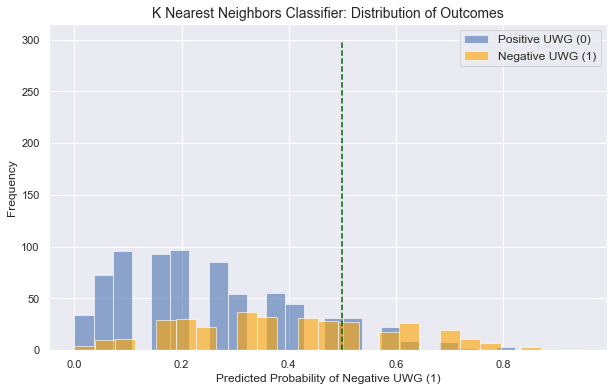

In [50]:
v_line_max = 300
plot_title = 'K Nearest Neighbors Classifier: Distribution of Outcomes'
prediction_probabilities = [i[1] for i in knncf.predict_proba(X_test)]
plot_distr_of_outcomes(prediction_probabilities, y_test, labels_list, plot_title, y_label, x_label, v_line_max)

### Plot Receiver Operator Curve (ROC)

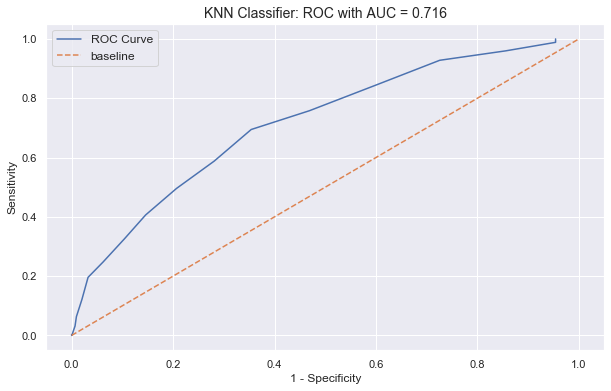

In [51]:
plot_title = 'KNN Classifier: ROC with AUC'
plot_roc(prediction_probabilities, y_test, plot_title)

## Support Vector Classifier

In [52]:
svcf = SVC(gamma='scale')
svcf.fit(X_train,y_train)
# Evaluate model
print('Score(train/test):',svcf.score(X_train, y_train),',',svcf.score(X_test, y_test))
# predict & evaluate
predictions = svcf.predict(X_test)
print('\n=== Classification Report  ================================')
print(classification_report(y_test,predictions,target_names=['Positive UWG (0)','Negative UWG (1)']))

Score(train/test): 0.7110429447852761 , 0.7083716651333947

=== Classification Report  ================================
                  precision    recall  f1-score   support

Positive UWG (0)       0.71      0.96      0.82       740
Negative UWG (1)       0.67      0.17      0.27       347

        accuracy                           0.71      1087
       macro avg       0.69      0.56      0.54      1087
    weighted avg       0.70      0.71      0.64      1087



##### The following grid search was carried out on Google Colab and this yielded the following results:
{'C': 0.9, 'gamma': 'auto', 'kernel': 'rbf', 'max_iter': 10000, 'tol': 0.01}
 <br>

In [41]:
# params = [{'C':[0.3,0.5,0.9],
#                'gamma':['auto'],
#                'kernel':['rbf','poly','sigmoid'],
#                'tol':[0.1,0.01,0.001],
#                'max_iter':[10000]
#               }]

# ss = StandardScaler()
# ss.fit(X_train)
# X_train_sc = ss.transform(X_train)
# X_test_sc = ss.transform(X_test)

# gs = GridSearchCV(SVC(), param_grid=params, cv=5)
# gs.fit(X_train_sc, y_train)
# gs.best_params_

In [55]:
svcf = SVC(C= 0.9, gamma= 'auto', kernel= 'rbf', max_iter= 10000, tol= 0.01)
svcf.fit(X_train,y_train)
# Evaluate model
print('Score(train/test):',svcf.score(X_train, y_train),',',svcf.score(X_test, y_test))
# predict & evaluate
predictions = svcf.predict(X_test)
print('\n=== Classification Report  ================================')
print(classification_report(y_test,predictions,target_names=['Positive UWG (0)','Negative UWG (1)']))

Score(train/test): 0.9978527607361963 , 0.6826126954921803

=== Classification Report  ================================
                  precision    recall  f1-score   support

Positive UWG (0)       0.68      0.99      0.81       740
Negative UWG (1)       0.60      0.02      0.03       347

        accuracy                           0.68      1087
       macro avg       0.64      0.51      0.42      1087
    weighted avg       0.66      0.68      0.56      1087



# Conclusion

To recap, the problem statement is to predict when the underwriting gain (UWG) is going to be negative. This is the Positive class in our classification problem. Accordingly, the most important metric is the Recall score, rather than merely the Accuracy.<br><br>
In the above modeling results, Extra Trees and Logistic Regression achieved the highest Accuracy scores of 0.74 and 0.72 respectively, both of which were higher than the Baseline Accuracy of 0.68.<br><br>
However, Logistic Regression achieved the highest Recall score of 0.44, compared to 0.33 by Extra Trees.<br><br>
We conclude that, given this dataset, Logistic Regression Classification performs best in predicting when the underwriting gain (UWG) is going to be negative.